In [1]:
import pickle
import numpy as np 
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
import os

# Load responsive neuron dictionary
file_path = 'responsive_neurons_vid1_coco.pkl'
with open(file_path, 'rb') as file: 
            spike_dict = pickle.load(file)

# load sorting indices so .mat way of indexing is converted to .py way (for the video clip numbers 0-450)
with open('sorting_index.pkl', 'rb') as file: 
    sorted_indices = pickle.load(file)

# check keys
print(spike_dict.keys())

dict_keys(['neuron_40', 'neuron_64', 'neuron_65', 'neuron_66', 'neuron_67', 'neuron_68', 'neuron_71', 'neuron_72', 'neuron_75', 'neuron_76', 'neuron_77', 'neuron_78', 'neuron_79', 'neuron_80', 'neuron_81', 'neuron_82', 'neuron_83', 'neuron_84', 'neuron_85', 'neuron_86', 'neuron_87', 'neuron_88', 'neuron_90', 'neuron_91', 'neuron_92', 'neuron_93', 'neuron_94', 'neuron_95', 'neuron_96', 'neuron_97', 'neuron_98', 'neuron_99', 'neuron_100', 'neuron_101', 'neuron_102', 'neuron_103', 'neuron_104', 'neuron_105', 'neuron_106', 'neuron_107', 'neuron_108', 'neuron_109', 'neuron_110', 'neuron_111', 'neuron_112', 'neuron_113', 'neuron_114', 'neuron_115', 'neuron_116', 'neuron_117', 'neuron_118', 'neuron_119', 'neuron_120', 'neuron_121', 'neuron_122', 'neuron_123', 'neuron_124', 'neuron_126', 'neuron_127', 'neuron_128', 'neuron_129', 'neuron_130', 'neuron_132', 'neuron_133', 'neuron_134', 'neuron_135', 'neuron_136', 'neuron_137', 'neuron_139', 'neuron_140', 'neuron_141', 'neuron_142', 'neuron_143',

In [ ]:
# OPTIONAL STEP, but neurons 0-128 are PTC neurons so we can filter all these out

# Create a new dictionary with keys 'neuron_128' and higher
# spike_dict = {k: v for k, v in spike_dict.items() if int(k.split('_')[1]) >= 128}

In [2]:
# split name parts to save files efficiently
file_name = os.path.basename(file_path)
name_parts = file_name.split('_')
video = name_parts[2]

monkey = name_parts[3].split('.')[0]

In [3]:
# Define video clip types and their index ranges
data_types = {'all': [0, 450],
              'natural_set': [0, 295],
              'repeated': [295, 320],
              'artificial': [320, 350],
              'gaudy': [350, 380],
              'spliced': [380, 400],
              'interleaved': [400, 420],
              'shuffled': [420, 440],
              'randomized_images': [440, 450]
             }


In [4]:
# get the spikes in order 
real_spikes = []
for x in spike_dict:
    real_spikes.append([spike_dict[x][i] for i in sorted_indices])

In [5]:
# Bin spike timings over entire video clip timing (250ms)
# Parameters
bin_width = 0.250  # bin width in seconds
max_time = 0.320   # maximum time to consider

# Create bins starting after the initial transient
bins = np.arange(0.07, max_time + bin_width, bin_width)
# Create time points for the center of each bin
bin_centers = bins[:-1] + bin_width / 2

# Bin the spike times for each trial
binned_spike_counts = []
for i in range(len(real_spikes)):
    bin_neuron = []
    for j in range(len(real_spikes[i])):
        b = []
        for spikes in real_spikes[i][j]:

            if len([spikes]) > 0:
                counts, _ = np.histogram(spikes, bins=bins)
                b.append(counts)
        bin_neuron.append(b)
    binned_spike_counts.append(bin_neuron)

In [8]:
avg_counts_per_stim = [[] for _ in binned_spike_counts]
avg_firing_rate = [[] for _ in binned_spike_counts]
for i in range(len(binned_spike_counts)):
    for j in range(len(binned_spike_counts[i])):
        
        avg_count = np.mean(binned_spike_counts[i][j], axis=0)
        avg_fire_rate = avg_count/0.350
        avg_counts_per_stim[i].append(avg_count)
        avg_firing_rate[i].append(avg_fire_rate)

In [11]:
# Normalize each row (neuron) to [0, 1]
normalized_array_row = (avg_firing_rate - np.min(avg_firing_rate, axis=1, keepdims=True)) / (np.max(avg_firing_rate, axis=1, keepdims=True) - np.min(avg_firing_rate, axis=1, keepdims=True))


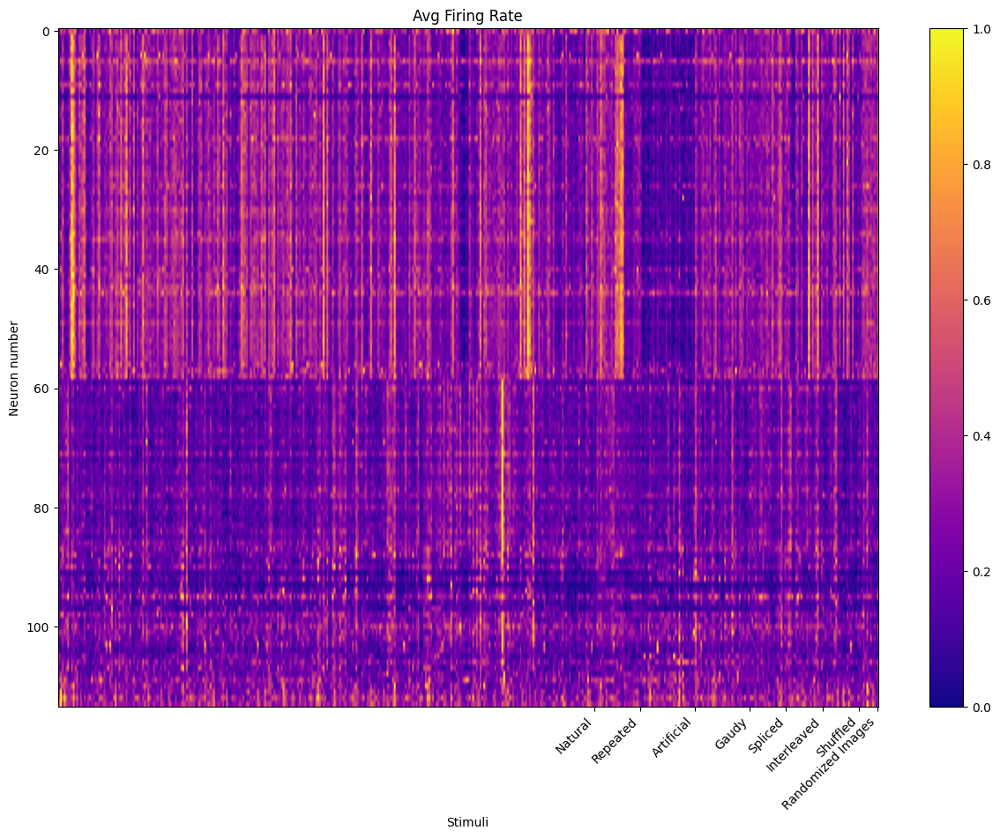

In [12]:
# Adjust the figure size to make it taller
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the height relative to the width

# Plot the data using imshow
cax = ax.imshow(normalized_array_row, aspect='auto', cmap='plasma')

# Add a colorbar
fig.colorbar(cax)

# Set custom x-axis ticks
custom_ticks = [294, 319, 349, 379, 399, 419, 439, 449]
ax.set_xticks(custom_ticks)

# Set custom x-axis tick labels
custom_labels = ['Natural', 'Repeated', 'Artificial', 'Gaudy', 'Spliced', 'Interleaved', 'Shuffled', 'Randomized Images']
ax.set_xticklabels(custom_labels, rotation=45, ha='right')

# Add title and labels
ax.set_title('Avg Firing Rate')
ax.set_xlabel('Stimuli')
ax.set_ylabel('Neuron number')
plt.savefig(f'{video}_{monkey}_avg_response_heatmap.png')
# Show the plot
plt.show()

In [12]:
# Bin the spike timings to 10ms to visual avg temporal response for each neuron
# Parameters
bin_width = 0.01  # bin width in seconds
max_time = 0.350   # maximum time to consider

# Create bins
bins = np.arange(0, max_time + bin_width, bin_width)
# Create time points for the center of each bin
bin_centers = bins[:-1] + bin_width / 2

# Bin the spike times for each trial
binned_spike_counts = []
for i in range(len(real_spikes)):
    bin_neuron = []
    for j in range(len(real_spikes[i])):
        b = []
        for spikes in real_spikes[i][j]:

            if len([spikes]) > 0:
                counts, _ = np.histogram(spikes, bins=bins)
                b.append(counts)
        bin_neuron.append(b)
    binned_spike_counts.append(bin_neuron)

In [13]:
avg_counts_per_stim = [[] for _ in binned_spike_counts]
avg_firing_rate = [[] for _ in binned_spike_counts]
for i in range(len(binned_spike_counts)):
    for j in range(len(binned_spike_counts[i])):
        
        avg_count = gaussian_filter1d(np.mean(binned_spike_counts[i][j], axis=0), sigma=1)
        
        avg_fire_rate = avg_count/0.350
        avg_counts_per_stim[i].append(avg_count)
        avg_firing_rate[i].append(avg_fire_rate)

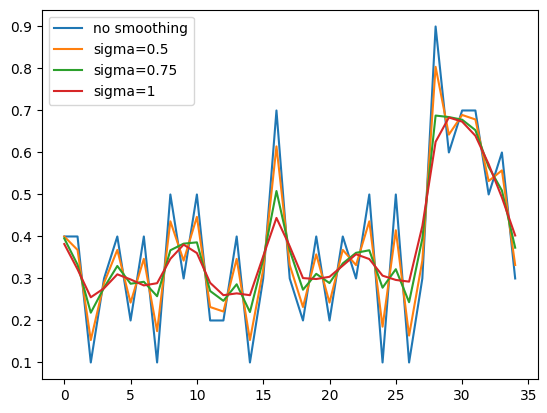

In [14]:
# test different sigmas for gaussian smoothing of spike timings
test_avg = np.mean(binned_spike_counts[5][5], axis=0)
smooth_test = gaussian_filter1d(test_avg, sigma=0.5)
smoother_test = gaussian_filter1d(test_avg, sigma=0.75)
smoothest_test = gaussian_filter1d(test_avg, sigma=1)
plt.plot(test_avg, label='no smoothing')
plt.plot(smooth_test, label='sigma=0.5')
plt.plot(smoother_test, label='sigma=0.75')
plt.plot(smoothest_test, label='sigma=1')
plt.legend()
plt.show()

In [16]:
def min_max_normalize(array):
    array = np.array(array)
    # Calculate the min and max for the entire array
    min_val = array.min()
    max_val = array.max()
    
    # Normalize the array
    normalized_array = (array - min_val) / (max_val - min_val)
    
    return normalized_array

In [17]:
# custom ticks corresponding to different types of video clips
custom_ticks = [0, 294, 319, 349, 379, 399, 419, 439]

In [18]:
# Normalize each array
normalized_arrays = [min_max_normalize(array) for array in avg_counts_per_stim]

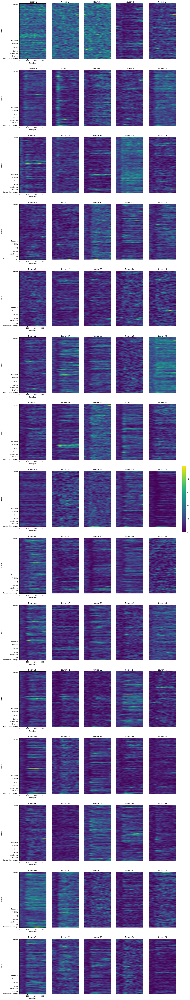

In [19]:

# Determine the number of rows and columns for the subplots
num_arrays = len(normalized_arrays)
num_cols = 5
num_rows = (num_arrays + num_cols - 1) // num_cols

# Create the subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 8))

# Plot each normalized array as a heatmap in a subplot
for i, ax in enumerate(axs.flat):
    if i < num_arrays:
        im = ax.imshow(normalized_arrays[i], cmap='viridis', aspect='auto')
        if i % num_cols == 0:  # Label the axes of the first subplot
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Stimuli')

            # Set custom ticks and labels
            ax.set_xticks([0, 10, 20, 30])
            ax.set_xticklabels(['0', '100', '200', '300'])
            ax.set_yticks(custom_ticks)
            ax.set_yticklabels(custom_labels, va='top')
        else:
            ax.axis('off')
        ax.set_title(f'Neuron {i+1}')
    else:
        ax.axis('off')
        
# Add a colorbar
cbar = fig.colorbar(im, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
# plt.savefig(f'{video}_{monkey}_temporal_heatmaps_normneuron.pdf', bbox_inches='tight')
plt.show()